In [1]:
# Importing the libraries


import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Avoid to truncating rows and column as well

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
# Import the dataset

df = pd.read_csv('gurgaon_properties_missing_value_imputation.csv')

In [4]:
# shape of the data

df.shape

(3427, 19)

In [5]:
df.head()

,property_type,society,sector,price,price_per_sqft,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score,area_room_ratio
0,flat,bestech altura,sector 79,1.85,8605.0,0.0,4,3+,11.0,New Property,1946.0,0,1,0,0,0,1,49,inf
1,flat,rof ananda,sector 95,0.46,6319.0,0.0,2,2,11.0,New Property,809.0,1,0,0,0,0,1,82,inf
2,flat,umang monsoon breeze,sector 78,0.95,5491.0,0.0,3,2,9.0,Relatively New,1730.0,0,0,0,0,0,2,65,inf
3,flat,tata primanti,sector 72,4.00,13769.0,1.0,5,2,7.0,Moderately Old,2629.0,0,1,0,0,0,1,38,2905.00
4,house,emaar mgf marbella,sector 66,9.00,21251.0,4.0,4,3+,2.0,Relatively New,5200.0,0,1,1,1,0,2,114,1058.75


In [6]:
# drop the column becoz price_per_sqft is highly co-related and i don't want society in input as well

train_df = df.drop(columns=['society','price_per_sqft'])

In [7]:
train_df.head()

,property_type,sector,price,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score,area_room_ratio
0,flat,sector 79,1.85,0.0,4,3+,11.0,New Property,1946.0,0,1,0,0,0,1,49,inf
1,flat,sector 95,0.46,0.0,2,2,11.0,New Property,809.0,1,0,0,0,0,1,82,inf
2,flat,sector 78,0.95,0.0,3,2,9.0,Relatively New,1730.0,0,0,0,0,0,2,65,inf
3,flat,sector 72,4.00,1.0,5,2,7.0,Moderately Old,2629.0,0,1,0,0,0,1,38,2905.00
4,house,sector 66,9.00,4.0,4,3+,2.0,Relatively New,5200.0,0,1,1,1,0,2,114,1058.75


### luxury score

<Axes: >

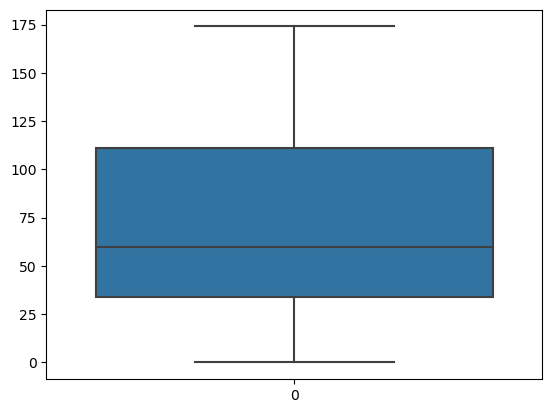

In [8]:
sns.boxplot(df['luxury_score'])

In [9]:
# split the luxury(numerical) column in to three categorical column 

def categorize_luxury(score):
    if 0 <= score < 50:
        return "Low"
    elif 50 <= score < 150:
        return "Medium"
    elif 150 <= score <= 175:
        return "High"
    else:
        return None  # or "Undefined" or any other label for scores outside the defined bins

In [10]:
train_df['luxury_category'] = train_df['luxury_score'].apply(categorize_luxury)

In [11]:
train_df.head()

,property_type,sector,price,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score,area_room_ratio,luxury_category
0,flat,sector 79,1.85,0.0,4,3+,11.0,New Property,1946.0,0,1,0,0,0,1,49,inf,Low
1,flat,sector 95,0.46,0.0,2,2,11.0,New Property,809.0,1,0,0,0,0,1,82,inf,Medium
2,flat,sector 78,0.95,0.0,3,2,9.0,Relatively New,1730.0,0,0,0,0,0,2,65,inf,Medium
3,flat,sector 72,4.00,1.0,5,2,7.0,Moderately Old,2629.0,0,1,0,0,0,1,38,2905.00,Low
4,house,sector 66,9.00,4.0,4,3+,2.0,Relatively New,5200.0,0,1,1,1,0,2,114,1058.75,Medium


### floorNum

<Axes: >

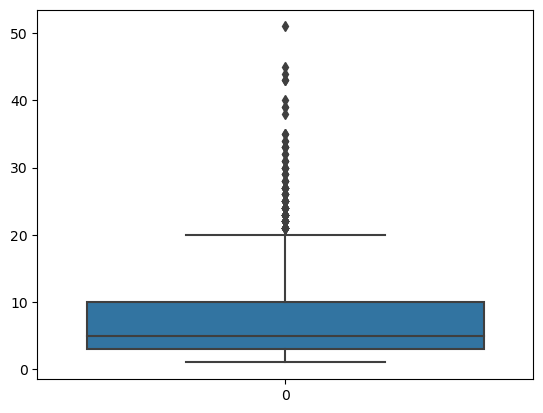

In [12]:
sns.boxplot(df['floorNum'])

In [13]:
# split the floorNum(numerical) column in to three categorical column 


def categorize_floor(floor):
    if 0 <= floor <= 2:
        return "Low Floor"
    elif 3 <= floor <= 10:
        return "Mid Floor"
    elif 11 <= floor <= 51:
        return "High Floor"
    else:
        return None  # or "Undefined" or any other label for floors outside the defined bins

In [14]:
train_df['floor_category'] = train_df['floorNum'].apply(categorize_floor)

In [15]:
train_df.head()

,property_type,sector,price,bedRoom,bathroom,balcony,floorNum,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,luxury_score,area_room_ratio,luxury_category,floor_category
0,flat,sector 79,1.85,0.0,4,3+,11.0,New Property,1946.0,0,1,0,0,0,1,49,inf,Low,High Floor
1,flat,sector 95,0.46,0.0,2,2,11.0,New Property,809.0,1,0,0,0,0,1,82,inf,Medium,High Floor
2,flat,sector 78,0.95,0.0,3,2,9.0,Relatively New,1730.0,0,0,0,0,0,2,65,inf,Medium,Mid Floor
3,flat,sector 72,4.00,1.0,5,2,7.0,Moderately Old,2629.0,0,1,0,0,0,1,38,2905.00,Low,Mid Floor
4,house,sector 66,9.00,4.0,4,3+,2.0,Relatively New,5200.0,0,1,1,1,0,2,114,1058.75,Medium,Low Floor


In [16]:
# drop now unnecessary column 

train_df.drop(columns=['floorNum','luxury_score'],inplace=True)

In [17]:
train_df.head()

,property_type,sector,price,bedRoom,bathroom,balcony,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,area_room_ratio,luxury_category,floor_category
0,flat,sector 79,1.85,0.0,4,3+,New Property,1946.0,0,1,0,0,0,1,inf,Low,High Floor
1,flat,sector 95,0.46,0.0,2,2,New Property,809.0,1,0,0,0,0,1,inf,Medium,High Floor
2,flat,sector 78,0.95,0.0,3,2,Relatively New,1730.0,0,0,0,0,0,2,inf,Medium,Mid Floor
3,flat,sector 72,4.00,1.0,5,2,Moderately Old,2629.0,0,1,0,0,0,1,2905.00,Low,Mid Floor
4,house,sector 66,9.00,4.0,4,3+,Relatively New,5200.0,0,1,1,1,0,2,1058.75,Medium,Low Floor


In [18]:
# Feature selection for converting categorical to numerical

from sklearn.preprocessing import OrdinalEncoder

# Create a copy of the original data for label encoding
data_label_encoded = train_df.copy()

categorical_cols = train_df.select_dtypes(include=['object']).columns

# Apply label encoding to categorical columns
for col in categorical_cols:
    oe = OrdinalEncoder()
    data_label_encoded[col] = oe.fit_transform(data_label_encoded[[col]])
    print(oe.categories_)

# Splitting the dataset into training and testing sets
X_label = data_label_encoded.drop('price', axis=1)
y_label = data_label_encoded['price']

[array(['flat', 'house'], dtype=object)]
[array(['dwarka expressway', 'gwal pahari', 'manesar', 'new',
       'new sector 2', 'sector 1', 'sector 102', 'sector 103',
       'sector 104', 'sector 105', 'sector 106', 'sector 107',
       'sector 108', 'sector 109', 'sector 10a', 'sector 11',
       'sector 110', 'sector 111', 'sector 112', 'sector 113',
       'sector 12', 'sector 13', 'sector 14', 'sector 15', 'sector 17',
       'sector 17a', 'sector 17b', 'sector 2', 'sector 21', 'sector 22',
       'sector 23', 'sector 24', 'sector 25', 'sector 26', 'sector 27',
       'sector 28', 'sector 3', 'sector 3 phase 2',
       'sector 3 phase 3 extension', 'sector 30', 'sector 31',
       'sector 33', 'sector 36', 'sector 36a', 'sector 37', 'sector 37c',
       'sector 37d', 'sector 38', 'sector 39', 'sector 4', 'sector 40',
       'sector 41', 'sector 43', 'sector 45', 'sector 46', 'sector 47',
       'sector 48', 'sector 49', 'sector 5', 'sector 50', 'sector 51',
       'sector 52', 'sect

In [19]:
X_label

,property_type,sector,bedRoom,bathroom,balcony,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,area_room_ratio,luxury_category,floor_category
0,0.0,91.0,0.0,4,4.0,1.0,1946.000000,0,1,0,0,0,1,inf,1.0,0.0
1,0.0,109.0,0.0,2,2.0,1.0,809.000000,1,0,0,0,0,1,inf,2.0,0.0
2,0.0,90.0,0.0,3,2.0,3.0,1730.000000,0,0,0,0,0,2,inf,2.0,2.0
3,0.0,85.0,1.0,5,2.0,0.0,2629.000000,0,1,0,0,0,1,2.905000e+03,1.0,2.0
4,1.0,76.0,4.0,4,4.0,3.0,5200.000000,0,1,1,1,0,2,1.058750e+03,2.0,1.0
5,0.0,27.0,0.0,2,3.0,0.0,1281.000000,0,0,0,0,0,1,inf,2.0,0.0
6,0.0,35.0,0.0,2,2.0,2.0,1120.000000,0,0,1,0,0,1,inf,2.0,0.0
7,0.0,16.0,0.0,4,3.0,0.0,3077.000000,0,1,0,0,0,2,inf,2.0,2.0
8,1.0,13.0,2.0,6,2.0,3.0,5400.000000,0,1,0,0,0,1,2.700000e+03,0.0,1.0
9,0.0,32.0,4.0,4,3.0,2.0,2744.000000,0,1,0,0,0,1,6.175000e+02,1.0,1.0


In [20]:
y_label

0        1.85
1        0.46
2        0.95
3        4.00
4        9.00
5        1.02
6        1.35
7        3.45
8        7.00
9        3.40
10       0.50
11       1.20
12       3.75
13       2.35
14       1.04
15       1.69
16       1.93
17       0.60
18       0.56
19       1.16
20       3.50
21       2.65
22       1.40
23       0.84
24       1.95
25       1.20
26       7.80
27       2.95
28       1.20
29       0.95
30       8.50
31       6.50
32       2.80
33       0.40
34       0.46
35       0.39
36       2.50
37       0.40
38       0.70
39       3.35
40       0.36
41       4.45
42       0.50
43      15.00
44       1.25
45       1.98
46       0.80
47       1.30
48       1.65
49       0.62
50       1.44
51       1.85
52       1.15
53       1.40
54       3.85
55       1.00
56       2.25
57       0.65
58       0.83
59       4.70
60       1.20
61       1.42
62       0.66
63       1.50
64       1.75
65       1.40
66       1.65
67       7.25
68       1.73
69       2.10
70       0.49
71    

### Technique 1 - Correlation Analysis

<Axes: >

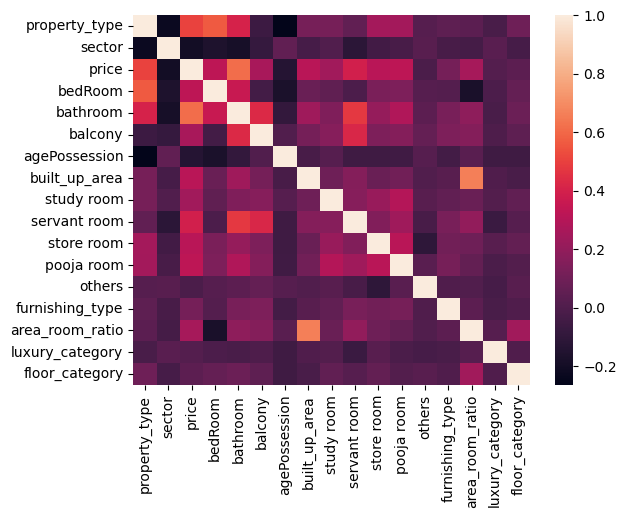

In [21]:
 sns.heatmap(data_label_encoded.corr())

In [22]:
# find the corelation between price and rest all 

fi_df1 = data_label_encoded.corr()['price'].iloc[1:].to_frame().reset_index().rename(columns={'index':'feature','price':'corr_coeff'})
fi_df1

,feature,corr_coeff
0,sector,-0.200806
1,price,1.000000
2,bedRoom,0.323858
3,bathroom,0.610472
4,balcony,0.262994
5,agePossession,-0.137550
6,built_up_area,0.312498
7,study room,0.240144
8,servant room,0.389843
9,store room,0.310289


In [23]:
X_label

,property_type,sector,bedRoom,bathroom,balcony,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,area_room_ratio,luxury_category,floor_category
0,0.0,91.0,0.0,4,4.0,1.0,1946.000000,0,1,0,0,0,1,inf,1.0,0.0
1,0.0,109.0,0.0,2,2.0,1.0,809.000000,1,0,0,0,0,1,inf,2.0,0.0
2,0.0,90.0,0.0,3,2.0,3.0,1730.000000,0,0,0,0,0,2,inf,2.0,2.0
3,0.0,85.0,1.0,5,2.0,0.0,2629.000000,0,1,0,0,0,1,2.905000e+03,1.0,2.0
4,1.0,76.0,4.0,4,4.0,3.0,5200.000000,0,1,1,1,0,2,1.058750e+03,2.0,1.0
5,0.0,27.0,0.0,2,3.0,0.0,1281.000000,0,0,0,0,0,1,inf,2.0,0.0
6,0.0,35.0,0.0,2,2.0,2.0,1120.000000,0,0,1,0,0,1,inf,2.0,0.0
7,0.0,16.0,0.0,4,3.0,0.0,3077.000000,0,1,0,0,0,2,inf,2.0,2.0
8,1.0,13.0,2.0,6,2.0,3.0,5400.000000,0,1,0,0,0,1,2.700000e+03,0.0,1.0
9,0.0,32.0,4.0,4,3.0,2.0,2744.000000,0,1,0,0,0,1,6.175000e+02,1.0,1.0


In [24]:
# Replace infinite values with a large constant


X_label.replace([np.inf, -np.inf], np.finfo(np.float32).max, inplace=True)

### Technique 2 - Random Forest Feature Importance

In [25]:
from sklearn.ensemble import RandomForestRegressor

# Train a Random Forest regressor on label encoded data
rf_label = RandomForestRegressor(n_estimators=100, random_state=42)
rf_label.fit(X_label, y_label)

# Extract feature importance scores for label encoded data
fi_df2 = pd.DataFrame({
    'feature': X_label.columns,
    'rf_importance': rf_label.feature_importances_
}).sort_values(by='rf_importance', ascending=False)

fi_df2

,feature,rf_importance
6,built_up_area,0.613016
0,property_type,0.110350
1,sector,0.098943
3,bathroom,0.035049
13,area_room_ratio,0.034389
8,servant room,0.026225
2,bedRoom,0.016527
5,agePossession,0.012961
4,balcony,0.010313
12,furnishing_type,0.009584


### Technique 3 - Gradient Boosting Feature importances

In [26]:
from sklearn.ensemble import GradientBoostingRegressor

# Train a Random Forest regressor on label encoded data
gb_label = GradientBoostingRegressor()
gb_label.fit(X_label, y_label)

# Extract feature importance scores for label encoded data
fi_df3 = pd.DataFrame({
    'feature': X_label.columns,
    'gb_importance': gb_label.feature_importances_
}).sort_values(by='gb_importance', ascending=False)

fi_df3

,feature,gb_importance
6,built_up_area,0.661815
1,sector,0.103182
0,property_type,0.094226
3,bathroom,0.057647
8,servant room,0.031320
2,bedRoom,0.024029
13,area_room_ratio,0.010851
9,store room,0.008113
5,agePossession,0.004108
12,furnishing_type,0.001314


### Technique 4 - Permutation Importance

In [27]:
from sklearn.inspection import permutation_importance
from sklearn.model_selection import train_test_split

X_train_label, X_test_label, y_train_label, y_test_label = train_test_split(X_label, y_label, test_size=0.2, random_state=42)

# Train a Random Forest regressor on label encoded data
rf_label = RandomForestRegressor(n_estimators=100, random_state=42)
rf_label.fit(X_train_label, y_train_label)

# Calculate Permutation Importance
perm_importance = permutation_importance(rf_label, X_test_label, y_test_label, n_repeats=30, random_state=42)

# Organize results into a DataFrame
fi_df4 = pd.DataFrame({
    'feature': X_label.columns,
    'permutation_importance': perm_importance.importances_mean
}).sort_values(by='permutation_importance', ascending=False)

fi_df4

,feature,permutation_importance
6,built_up_area,0.658096
0,property_type,0.172126
1,sector,0.109949
13,area_room_ratio,0.028595
3,bathroom,0.024003
8,servant room,0.020948
2,bedRoom,0.006300
5,agePossession,0.005987
4,balcony,0.005247
14,luxury_category,0.002345


### Technique 5 - LASSO

In [28]:
from sklearn.linear_model import Lasso
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_label)

# Train a LASSO regression model
# We'll use a relatively small value for alpha (the regularization strength) for demonstration purposes
lasso = Lasso(alpha=0.01, random_state=42)
lasso.fit(X_scaled, y_label)

# Extract coefficients
fi_df5 = pd.DataFrame({
    'feature': X_label.columns,
    'lasso_coeff': lasso.coef_
}).sort_values(by='lasso_coeff', ascending=False)

fi_df5


,feature,lasso_coeff
3,bathroom,0.910795
0,property_type,0.836758
6,built_up_area,0.425223
8,servant room,0.395129
9,store room,0.257887
7,study room,0.225883
10,pooja room,0.140219
14,luxury_category,0.082763
4,balcony,0.081081
12,furnishing_type,0.029392


### Technique 6 - RFE

In [29]:
from sklearn.feature_selection import RFE

# Initialize the base estimator
estimator = RandomForestRegressor()

# Apply RFE on the label-encoded and standardized training data
selector_label = RFE(estimator, n_features_to_select=X_label.shape[1], step=1)
selector_label = selector_label.fit(X_label, y_label)

# Get the selected features based on RFE
selected_features = X_label.columns[selector_label.support_]

# Extract the coefficients for the selected features from the underlying linear regression model
selected_coefficients = selector_label.estimator_.feature_importances_

# Organize the results into a DataFrame
fi_df6 = pd.DataFrame({
    'feature': selected_features,
    'rfe_score': selected_coefficients
}).sort_values(by='rfe_score', ascending=False)

fi_df6


,feature,rfe_score
6,built_up_area,0.616128
0,property_type,0.111057
1,sector,0.098404
13,area_room_ratio,0.035397
3,bathroom,0.032996
8,servant room,0.025646
2,bedRoom,0.016211
5,agePossession,0.012540
4,balcony,0.010321
12,furnishing_type,0.009854


### Technique 7 - Linear Regression Weights

In [30]:
from sklearn.linear_model import LinearRegression

In [31]:
# Train a linear regression model on the label-encoded and standardized training data
lin_reg = LinearRegression()
lin_reg.fit(X_scaled, y_label)

# Extract coefficients
fi_df7 = pd.DataFrame({
    'feature': X_label.columns,
    'reg_coeffs': lin_reg.coef_
}).sort_values(by='reg_coeffs', ascending=False)

fi_df7


,feature,reg_coeffs
3,bathroom,0.908262
0,property_type,0.837967
6,built_up_area,0.431962
8,servant room,0.398403
9,store room,0.260411
7,study room,0.232217
10,pooja room,0.143602
14,luxury_category,0.092601
4,balcony,0.088054
12,furnishing_type,0.036548


### Technique 8 - SHAP

In [32]:
!pip install shap

In [33]:
import shap

# Compute SHAP values using the trained Random Forest model
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_label, y_label)

explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X_label)

# Summing the absolute SHAP values across all samples to get an overall measure of feature importance
shap_sum = np.abs(shap_values).mean(axis=0)

shap_values


array([[-3.36067405e-01, -2.55800699e-01, -3.63096589e-02, ...,
         3.60359893e-02, -6.56819399e-03,  3.39204596e-02],
       [-2.12137330e-01, -5.41743948e-01, -3.49085110e-02, ...,
         2.09380603e-02,  8.11282000e-04,  1.21290036e-02],
       [-2.08528982e-01, -3.45568355e-01, -3.41517483e-02, ...,
         2.73460359e-02,  6.49449281e-04, -9.91867910e-03],
       ...,
       [-2.09994482e-01, -6.80894281e-02, -2.92264146e-02, ...,
         1.70529255e-02, -3.51856148e-03, -8.19595975e-03],
       [-1.85309417e-01, -2.48928247e-01,  1.18644892e-02, ...,
        -2.99202708e-02, -5.35552669e-04, -3.93367157e-03],
       [-4.22760412e-01, -5.95648845e-01, -3.16501097e-02, ...,
         2.53493735e-02, -6.04204882e-03, -5.69780486e-03]])

In [34]:
fi_df8 = pd.DataFrame({
    'feature': X_label.columns,
    'SHAP_score': np.abs(shap_values).mean(axis=0)
}).sort_values(by='SHAP_score', ascending=False)

fi_df8

,feature,SHAP_score
6,built_up_area,1.270561
0,property_type,0.508347
1,sector,0.390879
3,bathroom,0.137269
8,servant room,0.112442
13,area_room_ratio,0.064035
2,bedRoom,0.046470
4,balcony,0.035367
5,agePossession,0.026046
12,furnishing_type,0.023943


In [35]:
final_fi_df = fi_df1.merge(fi_df2,on='feature').merge(fi_df3,on='feature').merge(fi_df4,on='feature').merge(fi_df5,on='feature').merge(fi_df6,on='feature').merge(fi_df7,on='feature').merge(fi_df8,on='feature').set_index('feature')

In [36]:
final_fi_df


,corr_coeff,rf_importance,gb_importance,permutation_importance,lasso_coeff,rfe_score,reg_coeffs,SHAP_score
feature,,,,,,,,
sector,-0.200806,0.098943,0.103182,0.109949,-0.117806,0.098404,-0.125321,0.390879
bedRoom,0.323858,0.016527,0.024029,0.006300,0.000000,0.016211,-0.001571,0.046470
bathroom,0.610472,0.035049,0.057647,0.024003,0.910795,0.032996,0.908262,0.137269
balcony,0.262994,0.010313,0.000859,0.005247,0.081081,0.010321,0.088054,0.035367
agePossession,-0.137550,0.012961,0.004108,0.005987,-0.015966,0.012540,-0.023057,0.026046
built_up_area,0.312498,0.613016,0.661815,0.658096,0.425223,0.616128,0.431962,1.270561
study room,0.240144,0.005375,0.001096,-0.000413,0.225883,0.005273,0.232217,0.013391
servant room,0.389843,0.026225,0.031320,0.020948,0.395129,0.025646,0.398403,0.112442
store room,0.310289,0.006997,0.008113,-0.004265,0.257887,0.004764,0.260411,0.015987


In [37]:
# normalize the score
final_fi_df = final_fi_df.divide(final_fi_df.sum(axis=0), axis=1)

In [38]:
final_fi_df[['rf_importance','gb_importance','permutation_importance','rfe_score','SHAP_score']].mean(axis=1).sort_values(ascending=False)

feature
built_up_area      0.692306
sector             0.128545
bathroom           0.046175
servant room       0.033743
area_room_ratio    0.030618
bedRoom            0.018384
agePossession      0.010419
balcony            0.009286
furnishing_type    0.007027
luxury_category    0.005182
store room         0.004900
floor_category     0.003997
study room         0.003763
pooja room         0.003518
others             0.002137
dtype: float64

In [39]:
# to drop pooja room, study room, others
X_label

,property_type,sector,bedRoom,bathroom,balcony,agePossession,built_up_area,study room,servant room,store room,pooja room,others,furnishing_type,area_room_ratio,luxury_category,floor_category
0,0.0,91.0,0.0,4,4.0,1.0,1946.000000,0,1,0,0,0,1,3.402823e+38,1.0,0.0
1,0.0,109.0,0.0,2,2.0,1.0,809.000000,1,0,0,0,0,1,3.402823e+38,2.0,0.0
2,0.0,90.0,0.0,3,2.0,3.0,1730.000000,0,0,0,0,0,2,3.402823e+38,2.0,2.0
3,0.0,85.0,1.0,5,2.0,0.0,2629.000000,0,1,0,0,0,1,2.905000e+03,1.0,2.0
4,1.0,76.0,4.0,4,4.0,3.0,5200.000000,0,1,1,1,0,2,1.058750e+03,2.0,1.0
5,0.0,27.0,0.0,2,3.0,0.0,1281.000000,0,0,0,0,0,1,3.402823e+38,2.0,0.0
6,0.0,35.0,0.0,2,2.0,2.0,1120.000000,0,0,1,0,0,1,3.402823e+38,2.0,0.0
7,0.0,16.0,0.0,4,3.0,0.0,3077.000000,0,1,0,0,0,2,3.402823e+38,2.0,2.0
8,1.0,13.0,2.0,6,2.0,3.0,5400.000000,0,1,0,0,0,1,2.700000e+03,0.0,1.0
9,0.0,32.0,4.0,4,3.0,2.0,2744.000000,0,1,0,0,0,1,6.175000e+02,1.0,1.0


In [40]:
# with all the cols
from sklearn.model_selection import cross_val_score

rf = RandomForestRegressor(n_estimators=100, random_state=42)

scores = cross_val_score(rf, X_label, y_label, cv=5, scoring='r2')

In [41]:
scores.mean()

0.8031084411249502

In [42]:
rf = RandomForestRegressor(n_estimators=100, random_state=42)

scores = cross_val_score(rf, X_label.drop(columns=['pooja room', 'study room', 'others']), y_label, cv=5, scoring='r2')

In [43]:
scores.mean()

0.8018798110075267

In [44]:
export_df = X_label.drop(columns=['pooja room', 'study room', 'others'])
export_df['price'] = y_label

In [45]:
export_df.to_csv('gurgaon_properties_post_feature_selection.csv', index=False)

In [46]:
export_df

,property_type,sector,bedRoom,bathroom,balcony,agePossession,built_up_area,servant room,store room,furnishing_type,area_room_ratio,luxury_category,floor_category,price
0,0.0,91.0,0.0,4,4.0,1.0,1946.000000,1,0,1,3.402823e+38,1.0,0.0,1.85
1,0.0,109.0,0.0,2,2.0,1.0,809.000000,0,0,1,3.402823e+38,2.0,0.0,0.46
2,0.0,90.0,0.0,3,2.0,3.0,1730.000000,0,0,2,3.402823e+38,2.0,2.0,0.95
3,0.0,85.0,1.0,5,2.0,0.0,2629.000000,1,0,1,2.905000e+03,1.0,2.0,4.00
4,1.0,76.0,4.0,4,4.0,3.0,5200.000000,1,1,2,1.058750e+03,2.0,1.0,9.00
5,0.0,27.0,0.0,2,3.0,0.0,1281.000000,0,0,1,3.402823e+38,2.0,0.0,1.02
6,0.0,35.0,0.0,2,2.0,2.0,1120.000000,0,1,1,3.402823e+38,2.0,0.0,1.35
7,0.0,16.0,0.0,4,3.0,0.0,3077.000000,1,0,2,3.402823e+38,2.0,2.0,3.45
8,1.0,13.0,2.0,6,2.0,3.0,5400.000000,1,0,1,2.700000e+03,0.0,1.0,7.00
9,0.0,32.0,4.0,4,3.0,2.0,2744.000000,1,0,1,6.175000e+02,1.0,1.0,3.40
